In [1]:
!pip install baler-compressor
import baler_compressor.config as config_module
import baler_compressor.trainer as trainer_module
import baler_compressor.compressor as compressor_module
import baler_compressor.decompressor as decompressor_module

import torch
import numpy as np
import helper

/usr/local/lib/python3.10/dist-packages/baler_compressor/trainer.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
import sys
sys.path.append("./baler/")
import dense_demo as dense_demo_module
config.model = dense_demo_module.dense_demo

In [7]:
# Initialize config
config = config_module.Config

# Define config
#config.input_path = "input/exafel_1.npz"
#config.output_path = "output/"

config = config_module.Config
config.compression_ratio = 1000
config.epochs = 400
config.early_stopping = False
config.early_stopping_patience = 100
config.min_delta = 0
config.lr_scheduler = True
config.lr_scheduler_patience = 50
# config.model_name = "dense_demo"
config.model = dense_demo_module.dense_demo
config.model_type = "dense"
config.custom_norm = True
config.l1 = True
config.reg_param = 1
config.RHO = 0.05
config.lr = 0.001
config.batch_size = 75
config.test_size = 0.2
config.data_dimension = 2
config.apply_normalization = True
config.deterministic_algorithm = False
config.compress_to_latent_space = False
config.convert_to_blocks = [1, 150, 150]
config.verbose = False

# FPGA stuff
config.number_of_columns = 22500  # FIXME: this is doesn't need to be hardcoded
config.latent_space_size = 225  # FIXME: this is doesn't need to be hardcoded
config.default_reuse_factor = 1
config.default_precision = "ap_fixed<16,8>"
config.Strategy = "latency"
config.Part = "xcvu9p-flga2104-2L-e"
config.ClockPeriod = 5
config.IOType = "io_parallel"
config.InputShape = (1, 16)
config.ProjectName = "tiny_test_model"
config.OutputDir = "workspaces/FPGA_compression_workspace/first_FPGA_Compression_project/output/hls4ml"
config.InputData = None
config.OutputPredictions = None
config.csim = False
config.synth = True
config.cosim = False
config.export = False

input_data_path = "exafel/input/exafel_1.npz"
output_path = "exafel/output/"
model_path = output_path + "compressed_output/model.pt"
normalization_path = output_path + "compressed_output/normalization_features.npy"
compressed_path = output_path + "compressed_output/compressed.npz"
decompressed_path = output_path + "decompressed_output/decompressed.npz"

In [ ]:
model, normalization, loss_data = trainer_module.run(input_data_path, config)

In [10]:
torch.save(model.state_dict(), model_path)
np.save(normalization_path,normalization)

In [ ]:
compressed, names, original_shape = compressor_module.run(input_data_path, model_path,normalization, config)

In [ ]:
print("Latent space:\n",compressed[0])
np.savez_compressed(
    compressed_path,
    data=compressed,
    names=names,
    normalization_features=normalization,
    original_shape=original_shape,
)

In [ ]:
decompressed, names, original_shape = decompressor_module.run(model_path, compressed_path, config)

In [14]:
np.savez(decompressed_path, data=decompressed, names=names)

In [15]:
import demo_helper

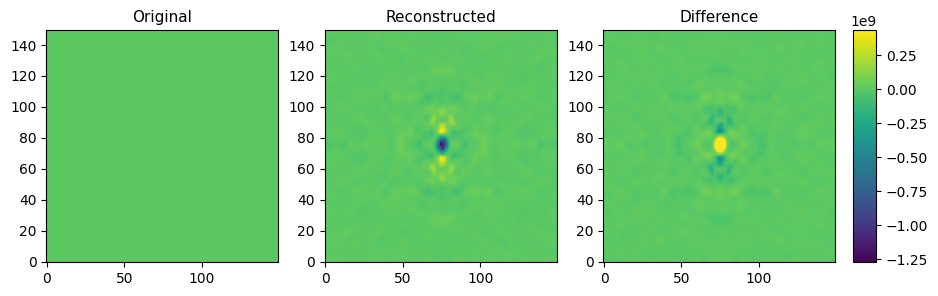

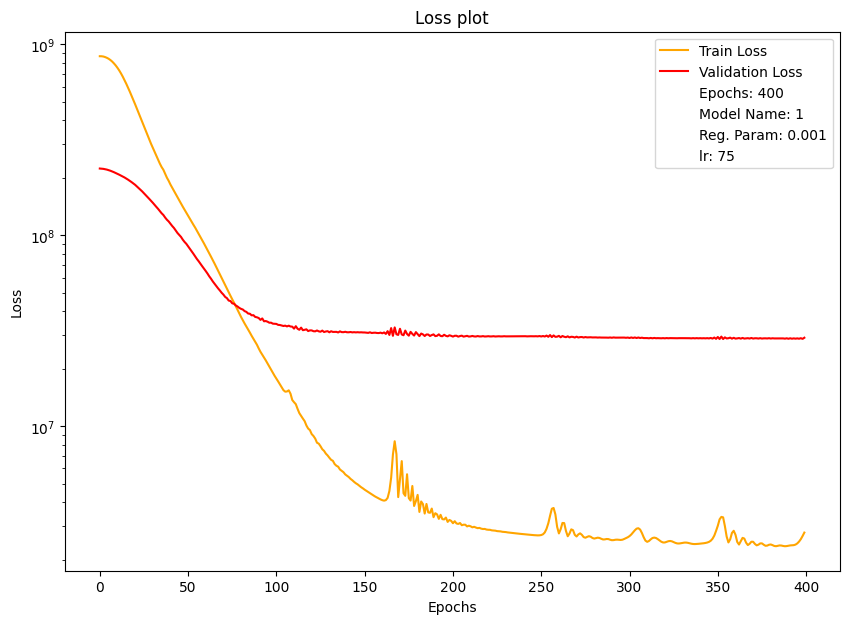

In [17]:
data = np.load("exafel/input/exafel_1.npz")["data"]
data_decompressed = np.load("exafel/output/decompressed_output/decompressed.npz")["data"].reshape(data.shape[0], data.shape[1], data.shape[2])
demo_helper.plot2D(data[0], data_decompressed[0])
demo_helper.loss_plot(loss_data[0], output_path + "plot_output", config)